This iPython notebook is an implementation of a popular paper ([Gatys et al., 2015](https://arxiv.org/abs/1508.06576)) that demonstrates how to use neural networks to transfer artistic style from one image onto another.

The implementation is slightly modified to use Densenet instead of VGG-Net and an additional regularization term is also added to the overall loss function.

The main objective of the algorithm is to merge two images, namely *content image (C)* and *style image (S)* to create a *generated image (G)* , which combines the content of the image C with the style of the image S.

For example, we can see the stylized image from the Taj Mahal (content image C), mixed with a painting by Van Gogh (style image S).

![style_transfer_img1](https://preview.ibb.co/iywBSd/mixed_img_2.png)

The algorithm uses neural representations which are obtained by using Convolution Neural Networks (CNN), which are most powerful in image processing tasks. A CNN consists of a number of convolutional and subsampling layers optionally followed by fully connected layers, where each layer can be understood as a collection of image filters, each of which extracts a certain feature from the input image also called as feature maps.

On training CNN for object recognition, along the processing hierarchy of the network, the feature maps represents more actual content of the image compared to its detailed pixel values. This can be visualized by reconstructing the image only from feature maps. This is called *content reconstruction*.

By including the feature correlations of multiple layers, we obtain a style representation of the input image, which captures its texture information but not the global arrangement. This representation captures general appearance in terms of colour and localised structures. This can be visualized by reconstructiing the image from feature maps showing texture information. This is called *style reconstruction*.

# Key notes from the paper

*   The representations of content and style in the CNN are separable.
*   Both representations can be independently manipulated to produce new, perceptually meaningful images.
* Based on a pre-trained VGG-Network with 16 convolutional layers (excluding 3-fully connected layers) of the 19 layer VGG-Network .
* Uses average pooling instead of max pooling at the pooling layers as it improves gradient flow and give better results.
* To obtain a representation of the style of an input image, we employ correlations between the different filter responses over the spatial extent of the feature maps.
* Style transfer is posed as an optimization problem:
$$g^* = \operatorname*{argmin}_g (\alpha L_{content}(c,g) + \beta L_{style}(s,g))$$

  * c = content image
  * s = style image
  * g = combination image
  * $L_{content}$ = content loss function
  * $L_{style}$ = style loss function
  * $\alpha$ = content weight
  * $\beta$ = style weight

* Above means that we are looking for an image **g** that differs very little in terms of *content* from image **c**, while simultaneously differing as little as possible in terms of style from image **s**.
* There are hyper-parameters $\alpha$ and $\beta$ to tune on how much of content & style is required in the final generated image.
* Normal VGG takes an image and returns a catergory score, but this paper instead takes the output at intermediate layers and construct $L_{content}$ and $L_{style}$.
* Hence, the main objective of the algorithm is to reduce above loss functions and produce a final image with style imposed on it.
* Uses L-BFGS as a valid quasi-Newton approach to solve the optimization problem.

# Algorithm details & loss functions

* It starts with using a pre-trained VGG-Network with 16 layers excluding fully connected layers.
* Content image, style image and generated image are passed to the network.
* Content loss at layer *l* is calculated as follows with respect to content image (*c)* and generated image *(g)*:
$$L_{content}(c,g,l) = \frac12 \sum_{i,j} (F^l_{ij} - P^l_{ij})^2$$
 
   * $P^l$ and $F^l$ are feature representation at layer l for content image (c) and generated image (g) respectively
   * Above squared-error loss between two feature representations is minimized using standard error back-propagation.
   * Initially *g* is a white noise image (randomly initialised image) and it is changed during back-propagation until it generates the same response in a certain layer l of the CNN as the original image *c*.
   * Hence we must choose a layer which captures high-level content in terms of objects and their arrangement in the input image but should not constrain the exact pixel values of the reconstruction. This can be done by performing content reconstruction by using above loss function.
   
* Style loss is slightly tricky and is calculated as follows with respect to style image (s) and generated image (g):
  * Feature correlations are calculated by the Gram matrix $G^l$, where $G^l_{ij}$ is the inner product between the vectorised feature map *i* and *j* in layer *l*:
  $$G^l_{ij} = \sum_{k} F^l_{ik} F^l_{jk}$$
  * Intially *g* is a white noise image, we then use gradient descent to update *g* so that it matches the style of image *s*. This is done by minimising the mean-squared distance between the entries of the Gram matrix from the style image *(s)* and the Gram matrix of the image to be generated *(g)*.
  * The loss at a specific layer l is calculated as follows:
  $$E_l = \frac1{4N^2_lM^2_l} \sum_{i,j} (G^l_{ij} - A^l_{ij})^2$$
    * N = number of channels
    * M = size of the image (height * width)
    * $G^l_{ij}$ = style representation (gram matrix) for style image *(s)*
    * $A^l_{ij}$ = style representation (gram matrix) for generated image *(g)*
  * Loss function $E_l$ is only from a specifc layer l. But it is seen that when we combine textures (styles) from multiple layers we get better results. Hence overall style loss function is as follows:
$$L_{style}(s,g) = \sum_{l=0}^{L} w_lE_l$$
    * $w_l$ is weighting factors of the contribution of each layer to the overall loss. it is seen in paper to be set as $\frac{1}{num-of-layers-considered-in-style-loss-function}$
    * Layers are selected by performing style reconstruction by using above loss function.
* Using *content reconstruction* and *style reconstruction* we can visually select layers. Using the feature-maps at appropriate layers we minimise overall loss function to generate final image.
* Hence here image generation is posed as an optimisation problem.

# Modifications to the approach

* Implementation in this notebook is inspired from [VGG16 Style transfer implementation](https://github.com/hnarayanan/artistic-style-transfer/blob/master/notebooks/6_Artistic_style_transfer_with_a_repurposed_VGG_Net_16.ipynb), where author uses VGG-Network with 16 layers as proposed in the paper.
* In this notebook, we will be using [DenseNet](https://arxiv.org/pdf/1608.06993.pdf) (Densely connected CNN), which has better state of the art results on most popular datasets.
* We use Keras for implementing the algorithm. Also, Keras supports following densenet models:
  * DenseNet121
  * DenseNet169
  * DenseNet201
* We will be using *DenseNet121* so that we can save some computation time and also have quick results. Higher models may give better results, which will be experimented later. 
* To the overall loss function, we will also add [total variation loss](https://arxiv.org/pdf/1412.0035.pdf) as it helps in reducing the noise in the final image and is also a regularisation term encouraging spatial smoothness.

# Implementation of the artistic style transfer algorithm

* We start by importing required modules.
* It can be seen below that we are importing *DenseNet121* which comes with keras package.
* We also import few additional modules like requests, io, Ipython to download images from internet and also to display them.

In [1]:
from __future__ import print_function

import time
from PIL import Image
import numpy as np

from keras import backend
from keras.models import Model
from keras.applications.densenet import DenseNet121, preprocess_input

from scipy.optimize import fmin_l_bfgs_b
from scipy.misc import imsave

import requests
from io import BytesIO
from cStringIO import StringIO
import IPython.display

Using TensorFlow backend.


## Load and preprocess the content and style images

* Our first task is to load the content and style images.
* Note that due to memory constraints, we use `224 x 224` size image to choose appropriate layers for content and style representations.
* Once the layers and hyper-parameters are finalised, we can then pass higher size image to get better view of the output.

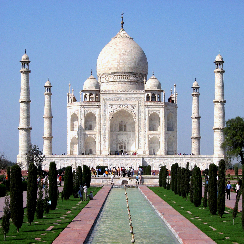

In [2]:
height = 244
width = 244

img_url = "https://upload.wikimedia.org/wikipedia/commons/c/c8/Taj_Mahal_in_March_2004.jpg"

response = requests.get(img_url)
content_image = Image.open(BytesIO(response.content))
content_image = content_image.resize((width, height))
content_image

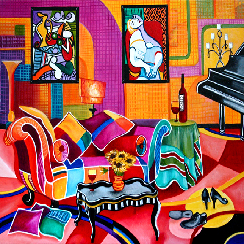

In [3]:
img_url = "http://1.bp.blogspot.com/-yqh8zFJh_OU/UcDJKe-EYaI/AAAAAAAAS2I/Qb3bm2zwQu0/s1600/%5BIMG+SRC=%22URL%22+ALT=picasso+painting,+romancing+picasso+painting,+colorful+oil+painting,k+madison+moore+artist%5D++copy.jpg"

response = requests.get(img_url)
style_image = Image.open(BytesIO(response.content))
style_image = style_image.resize((width, height))
style_image

Then, we convert these images into a form suitable for numerical processing. In particular, we add another dimension (beyond the classic height x width x 3 dimensions) so that we can later concatenate the representations of these two images into a common data structure.

In [4]:
content_array = np.asarray(content_image, dtype='float32')
content_array = np.expand_dims(content_array, axis=0)
print(content_array.shape)

style_array = np.asarray(style_image, dtype='float32')
style_array = np.expand_dims(style_array, axis=0)
print(style_array.shape)

(1, 244, 244, 3)
(1, 244, 244, 3)


Now we're ready to use these arrays to define variables in Keras' backend (the TensorFlow graph). We also introduce a placeholder variable to store the *combination* image (generated image) that retains the content of the content image while incorporating the style of the style image.

In [0]:
content_image = backend.variable(content_array)
style_image = backend.variable(style_array)
combination_image = backend.placeholder((1, height, width, 3))

Finally, we concatenate all this image data into a single tensor that's suitable for processing by Keras' DenseNet121 model.

In [0]:
input_tensor = backend.concatenate([content_image,
                                    style_image,
                                    combination_image], axis=0)

## Reuse a model pre-trained for image classification to define loss functions

The core idea introduced by [Gatys et al. (2015)](https://arxiv.org/abs/1508.06576) is that convolutional neural networks (CNNs) pre-trained for image classification already know how to encode perceptual and semantic information about images. We're going to follow their idea, and use the *feature spaces* provided by one such model to independently work with content and style of images.

The original paper uses the 19 layer VGG network model from [Simonyan and Zisserman (2015)](https://arxiv.org/abs/1409.1556), but we're going to instead use [DenseNet121](https://arxiv.org/pdf/1608.06993.pdf) model.

Also, since we're not interested in the classification problem, we don't need the fully connected layers or the final softmax classifier. We only need the part of the model before *"Classification Layer"* from below architectures:

![DenseNet Network Architectures](https://imgur.com/oiTdqJL.jpg)

As seen above, for DenseNet-121 there are 121 layers (1 right after Input Layer, 116 from Dense Block, 3 from Transition Layer & 1 FC Layer).
Note: Pooling is not considered as a layer.

It is trivial for us to get access to this truncated model because Keras comes with a set of pretrained models, including the DenseNet121 model we're interested in. Note that by setting `include_top=False` in the code below, we don't include any of the fully connected layers.

In [0]:
model = DenseNet121(input_tensor=input_tensor, weights='imagenet',
                    include_top=False)

As it is clear from the table above, the model we're working with has a lot of layers. Keras has its own names for these layers. Let's make a list of these names so that we can easily refer to individual layers later.

In [8]:
layers = dict([(layer.name, layer.output) for layer in model.layers])
layers

{'bn': <tf.Tensor 'bn/cond/Merge:0' shape=(3, 7, 7, 1024) dtype=float32>,
 'conv1/bn': <tf.Tensor 'conv1/bn/cond/Merge:0' shape=(3, 122, 122, 64) dtype=float32>,
 'conv1/conv': <tf.Tensor 'conv1/conv/convolution:0' shape=(3, 122, 122, 64) dtype=float32>,
 'conv1/relu': <tf.Tensor 'conv1/relu/Relu:0' shape=(3, 122, 122, 64) dtype=float32>,
 'conv2_block1_0_bn': <tf.Tensor 'conv2_block1_0_bn/cond/Merge:0' shape=(3, 61, 61, 64) dtype=float32>,
 'conv2_block1_0_relu': <tf.Tensor 'conv2_block1_0_relu/Relu:0' shape=(3, 61, 61, 64) dtype=float32>,
 'conv2_block1_1_bn': <tf.Tensor 'conv2_block1_1_bn/cond/Merge:0' shape=(3, 61, 61, 128) dtype=float32>,
 'conv2_block1_1_conv': <tf.Tensor 'conv2_block1_1_conv/convolution:0' shape=(3, 61, 61, 128) dtype=float32>,
 'conv2_block1_1_relu': <tf.Tensor 'conv2_block1_1_relu/Relu:0' shape=(3, 61, 61, 128) dtype=float32>,
 'conv2_block1_2_conv': <tf.Tensor 'conv2_block1_2_conv/convolution:0' shape=(3, 61, 61, 32) dtype=float32>,
 'conv2_block1_concat': <t

If you stare at the list above, you'll convince yourself that we covered all items we wanted in the table. Notice also that because we provided Keras with a concrete input tensor, the various TensorFlow tensors get well-defined shapes.

---

The crux of the paper we're trying to reproduce is that the style transfer problem can be posed as an optimisation problem, where the loss function we want to minimise can be decomposed into three distinct parts: the *content loss*, the *style loss* and the *total variation loss*.


* We introduce a function called `visualize_img`, which will help us visualise image during content and style reconstruction.
* We also introduce an `Evaluator` class that computes loss and gradients in one pass while retrieving them via two separate functions, `loss` and `grads`. This is done because `scipy.optimize` requires separate functions for loss and gradients, but computing them separately would be inefficient.
* `Evaluator` class is defined here so that this can be used for content and style reconstruction later.

In [0]:
import copy

def visualise_img(x, h, w):
    x_p = copy.deepcopy(x)
    x_p = x_p.reshape((h, w, 3))
    x_p = np.clip(x_p, 0, 255).astype('uint8')
    f = StringIO()
    Image.fromarray(x_p).save(f, 'png')
    IPython.display.display(IPython.display.Image(data=f.getvalue()))

class Evaluator(object):

    def __init__(self, f_outputs, height, width):
        self.loss_value = None
        self.grads_values = None
        self.f_outputs = f_outputs
        self.height = height
        self.width = width

    def eval_loss_and_grads(self, x):
        x = x.reshape((1, self.height, self.width, 3))
        outs = self.f_outputs([x])
        loss_value = outs[0]
        grad_values = outs[1].flatten().astype('float64')
        return loss_value, grad_values

    def loss(self, x):
        assert self.loss_value is None
        loss_value, grad_values = self.eval_loss_and_grads(x)
        self.loss_value = loss_value
        self.grad_values = grad_values
        return self.loss_value

    def grads(self, x):
        assert self.loss_value is not None
        grad_values = np.copy(self.grad_values)
        self.loss_value = None
        self.grad_values = None
        return grad_values

### The content loss

The content loss is the (scaled, squared) Euclidean distance between feature representations of the content and combination images.

In [0]:
def content_loss(content, combination):
    return backend.sum(backend.square(combination - content)) / 2

### Selecting layer for content representation

For the content loss, we see that in Gatys et al. (2015) the choice of layer is made based on the ability of the feature-map to reconstruct image which preserves the high-level content of the original image but loses the exact pixel information.

**For example:**
![content_image_layer](https://shafeentejani.github.io/assets/images/style_transfer/object_reconstruction.png)

* It can be seen that `relu5_1` in above figure is a perfect choice.
* So we'll have to find a layer which gives same result as above choice.
* We define below function `content_image_reconstruction`, which reconstructs image from a specific layer.
* In *content reconstruction*, we take content image and generated (combination) image and try to minimise content loss. It runs for 20 iterations and the gradients updates the combination image. After 20 iterations, we get reconstructed image.
* We stop after 20 iterations, because the loss stops reducing significantly.

In [0]:
def content_image_reconstruction(layer_name):
  layer_features = layers[layer_name]
  content_image_features = layer_features[0, :, :, :]
  combination_features = layer_features[2, :, :, :]

  loss = content_loss(content_image_features,
                      combination_features)

  grads = backend.gradients(loss, combination_image)
  outputs = [loss]
  outputs += grads
  f_outputs = backend.function([combination_image], outputs)

  evaluator = Evaluator(f_outputs, height, width)  

  # white noise image
  x = np.random.uniform(0, 255, (1, height, width, 3))

  iterations = 20
  
  # print layer-name & number of iterations
  title = layer_name + " (%d-iters):" % (iterations)
  print(title)
  print('='*len(title))
  for i in range(iterations):
      start_time = time.time()
      x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(),
                                       fprime=evaluator.grads, maxfun=20)
      end_time = time.time()
      
      # print loss value & time taken in iteration i
      # format: loss(time-in-seconds)
      print("%.2f(%ds)," % (min_val, end_time - start_time), end='')
      
      # print new line so that we don't exceed way out of screen
      if (i % 10 == 9):
        print()
  print()
  visualise_img(x, height, width)

* Using above function we can go through each layer and figure out the image required for content representation.
* But since there are so many layers to go through, we first start with selecting one layer from each convX-block1-bn, where X is ranges from 1 to 5.
* Reconstruction function outputs loss & time taken in each iteration in this format: `loss(time-in-secs), ...` along with reconstructed image.




conv1/bn (20-iters):
504451.44(1s),54016.53(0s),21806.86(0s),13166.37(0s),9437.42(0s),6982.75(0s),5386.82(0s),4158.95(0s),3109.65(0s),2455.14(0s),
2033.72(0s),1779.91(0s),1520.70(0s),1321.28(0s),1168.30(0s),1025.88(0s),915.91(0s),784.21(0s),684.80(0s),525.69(0s),



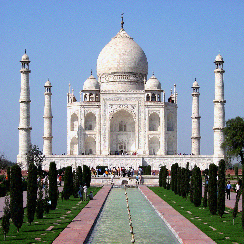

conv2_block1_0_bn (20-iters):
2099155.00(1s),1302239.75(0s),1073201.00(0s),964935.75(0s),908546.75(0s),878296.38(0s),855785.00(0s),840794.62(0s),829856.00(0s),823038.12(0s),
817763.12(0s),813637.31(0s),810452.50(0s),807842.88(0s),805559.62(0s),803567.00(0s),801567.69(0s),799761.75(0s),798208.88(0s),796698.38(0s),



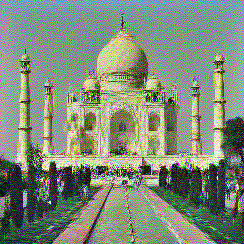

conv3_block1_0_bn (20-iters):
59121.86(3s),20934.72(1s),12289.31(1s),8775.93(1s),6765.74(1s),5525.70(1s),4726.24(1s),4207.69(1s),3810.63(1s),3520.18(1s),
3282.23(1s),3091.47(1s),2933.25(1s),2785.52(1s),2663.71(1s),2560.16(1s),2460.03(1s),2377.12(1s),2304.42(1s),2233.12(1s),



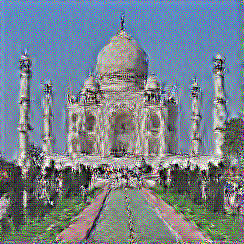

conv4_block1_0_bn (20-iters):
4873.72(4s),2298.30(2s),1560.49(2s),1242.56(2s),1071.88(2s),956.79(2s),875.81(2s),815.86(2s),771.03(2s),736.74(2s),
708.67(2s),685.85(2s),665.94(2s),647.98(2s),631.72(2s),618.58(2s),605.77(2s),594.61(2s),584.03(2s),573.88(2s),



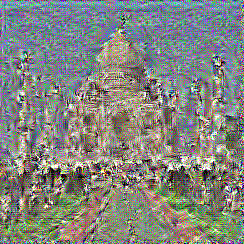

conv5_block1_0_bn (20-iters):
2552.67(7s),1157.08(3s),744.59(3s),563.09(3s),468.59(3s),411.64(3s),367.81(3s),336.28(3s),308.74(3s),287.58(3s),
270.67(3s),256.22(3s),244.51(3s),233.93(3s),225.00(3s),216.94(3s),209.04(3s),202.07(3s),195.47(3s),189.71(3s),



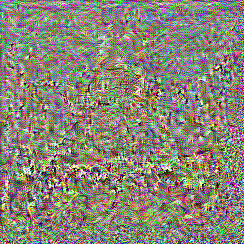

In [12]:
layer_names = ['conv1/bn', 'conv2_block1_0_bn', 'conv3_block1_0_bn',
               'conv4_block1_0_bn', 'conv5_block1_0_bn']
for cnn_layer in layer_names:
  content_image_reconstruction(cnn_layer)

* We can see above that `conv1` & `conv2` gives better image. And other layers are losing too much information.
* It can also be seen that `conv1` is not losing pixel information and hence we drop looking at that layer as well. And go through other layers with prefix `conv1`
* Hence, we now go through each intial block of all the layers starting with `conv2`.

conv1/conv (20-iters):
35026064.00(1s),7755294.00(0s),3448869.00(0s),1467268.62(0s),883612.62(0s),472427.69(0s),321004.12(0s),218103.91(0s),161746.41(0s),119318.51(0s),
90769.68(0s),72925.20(0s),55592.41(0s),43786.45(0s),33882.90(0s),27347.78(0s),23114.65(0s),19281.43(0s),16026.20(0s),12873.27(0s),



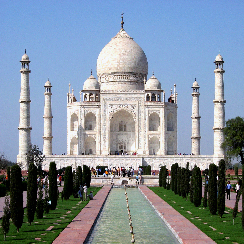

conv1/relu (20-iters):
281166.06(1s),81516.14(0s),46891.80(0s),33692.56(0s),26099.80(0s),21621.65(0s),17963.58(0s),15170.31(0s),12876.07(0s),11070.13(0s),
9584.99(0s),8359.66(0s),7392.63(0s),6632.40(0s),5918.79(0s),5271.10(0s),4731.73(0s),4249.26(0s),3773.69(0s),3353.47(0s),



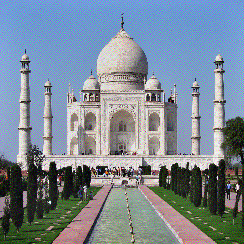

conv2_block1_0_bn (20-iters):
2077690.75(1s),1297634.75(0s),1065118.12(0s),969035.62(0s),920423.62(0s),888340.19(0s),866674.75(0s),849609.81(0s),839982.88(0s),831954.75(0s),
825746.25(0s),820688.69(0s),817111.38(0s),814180.12(0s),811574.75(0s),809443.44(0s),807770.81(0s),806163.25(0s),804859.00(0s),803798.56(0s),



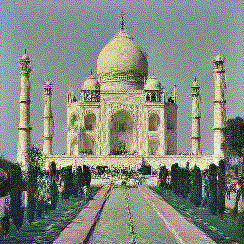

conv2_block2_0_bn (20-iters):
3599795.50(1s),1965514.75(0s),1461563.62(0s),1239990.12(0s),1118528.25(0s),1056392.25(0s),1013804.81(0s),985027.50(0s),963646.00(0s),948284.88(0s),
936322.75(0s),927495.06(0s),919769.19(0s),913719.81(0s),908395.69(0s),903713.88(0s),900069.62(0s),897239.88(0s),894766.38(0s),892832.25(0s),



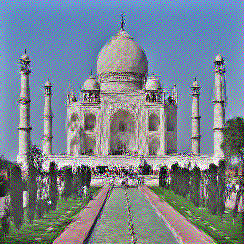

conv2_block3_0_bn (20-iters):
1509662.50(1s),987315.94(0s),812963.69(0s),711396.81(0s),642204.38(0s),595465.50(0s),558131.25(0s),531091.50(0s),512692.69(0s),497926.28(0s),
487139.50(0s),479659.16(0s),473916.38(0s),469242.09(0s),465266.41(0s),461887.88(0s),458609.19(0s),456144.53(0s),453932.72(0s),452020.09(0s),



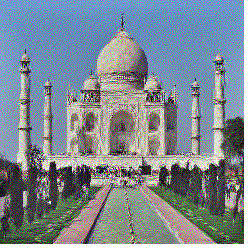

conv2_block4_0_bn (20-iters):
817334.50(2s),529482.31(0s),433458.34(0s),379504.44(0s),345619.38(0s),321840.25(1s),303609.03(1s),286879.56(1s),275201.00(1s),266681.84(1s),
260808.50(1s),256007.50(1s),251813.97(1s),248534.69(1s),243034.58(1s),239398.09(1s),236626.31(1s),232848.12(1s),230219.53(1s),227750.44(1s),



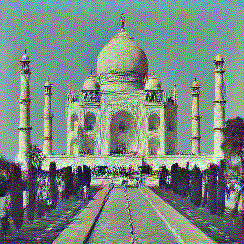

conv2_block5_0_bn (20-iters):
994609.19(2s),476686.19(1s),329458.12(1s),261226.70(1s),225156.59(1s),199299.69(1s),179828.27(1s),165918.86(1s),155851.05(1s),147724.77(1s),
140955.98(1s),135559.48(1s),130695.29(1s),127008.45(1s),123451.01(1s),119789.25(1s),116530.19(1s),114030.12(1s),112105.78(1s),110456.91(1s),



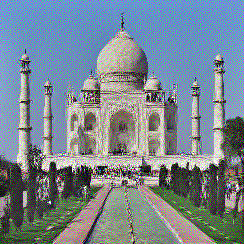

conv2_block6_0_bn (20-iters):
628167.31(2s),322538.91(1s),222755.81(1s),176006.09(1s),150722.50(1s),133302.77(1s),121408.76(1s),112559.49(1s),105638.49(1s),100142.46(1s),
95568.89(1s),91572.27(1s),88298.80(1s),85593.97(1s),83545.72(1s),81780.02(1s),80179.57(1s),78643.95(1s),77178.64(1s),75794.45(1s),



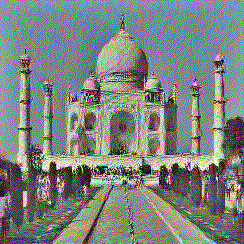

In [13]:
layer_names = ['conv1/conv', 'conv1/relu', 'conv2_block1_0_bn',
               'conv2_block2_0_bn', 'conv2_block3_0_bn',
               'conv2_block4_0_bn', 'conv2_block5_0_bn', 'conv2_block6_0_bn']
for cnn_layer in layer_names:
  content_image_reconstruction(cnn_layer)

* It can be seen above that `block 5,6` are also loosing enough information. And hence we now go through all the layers with prefix `conv1/relu`, `conv2_block1`, `conv2_block2`, `conv2_block3`, `conv2_block4`
* Due to memory constraints, below code is commented and only shows those images which can be candidate content representation layer.

conv1/relu (20-iters):
283393.78(1s),80843.02(0s),45512.79(0s),32863.82(0s),25849.57(0s),21302.49(0s),17761.21(0s),15102.54(0s),13017.16(0s),11305.61(0s),
9991.99(0s),8932.42(0s),7975.80(0s),7025.18(0s),6240.68(0s),5567.58(0s),4957.10(0s),4435.38(0s),3983.34(0s),3550.30(0s),



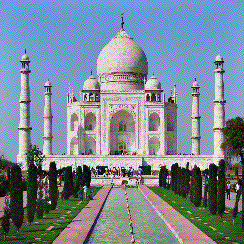

conv2_block1_0_bn (20-iters):
1993353.62(1s),1245978.12(0s),1037743.12(0s),933809.50(0s),884536.88(0s),853225.94(0s),830494.62(0s),814567.50(0s),802769.69(0s),792622.75(0s),
786744.00(0s),782000.62(0s),778532.50(0s),775759.00(0s),773358.31(0s),771393.62(0s),769798.12(0s),768275.88(0s),766808.38(0s),765604.62(0s),



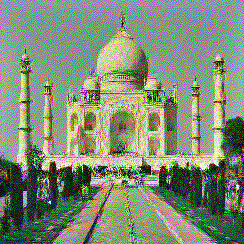

conv2_block3_0_relu (20-iters):
1045752.00(2s),634954.62(0s),503958.69(0s),441780.16(0s),410652.59(0s),392736.31(0s),381095.34(0s),373464.69(0s),367590.84(0s),363492.09(0s),
360444.66(0s),357877.94(0s),355596.84(0s),353869.19(0s),352315.56(0s),351064.62(0s),349965.62(0s),349030.81(0s),348211.38(0s),347308.59(0s),



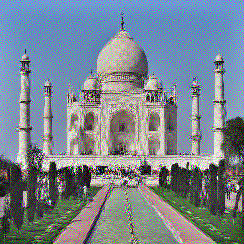

conv2_block4_0_relu (20-iters):
338053.59(2s),203081.78(0s),157104.81(0s),136329.53(0s),123336.94(0s),115110.89(0s),110023.11(0s),106145.56(1s),102738.68(1s),100126.80(1s),
98208.25(1s),96893.77(1s),95898.84(1s),94809.66(1s),94005.39(1s),93363.84(1s),92789.95(1s),92230.16(1s),91775.02(1s),91475.80(1s),



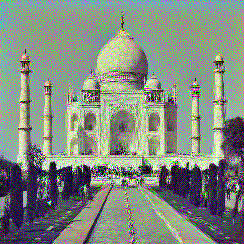

In [14]:
layer_names = ['conv2_block1_0_bn', 'conv2_block1_0_relu', 'conv2_block1_1_bn',
               'conv2_block1_1_conv', 'conv2_block1_1_relu',
               'conv2_block1_2_conv', 'conv2_block1_concat',
               'conv2_block2_0_bn', 'conv2_block2_0_relu', 'conv2_block2_1_bn',
               'conv2_block2_1_conv', 'conv2_block2_1_relu',
               'conv2_block2_2_conv', 'conv2_block2_concat',
               'conv2_block3_0_bn', 'conv2_block3_0_relu', 'conv2_block3_1_bn',
               'conv2_block3_1_conv', 'conv2_block3_1_relu',
               'conv2_block3_2_conv', 'conv2_block3_concat',
               'conv2_block4_0_bn', 'conv2_block4_0_relu',
               'conv2_block4_1_bn', 'conv2_block4_1_conv',
               'conv2_block4_1_relu', 'conv2_block4_2_conv',
               'conv2_block4_concat']
# for cnn_layer in layer_names:
#   content_image_reconstruction(cnn_layer)

candidate_layer_names = ['conv1/relu', 'conv2_block1_0_bn',
                         'conv2_block3_0_relu', 'conv2_block4_0_relu']
for cnn_layer in candidate_layer_names:
  content_image_reconstruction(cnn_layer)

* It can be inferred from above that `conv2_block1_0_bn`, `conv2_block3_0_relu`, `conv2_block4_0_relu` can be good choice.

### The style loss

This is where things start to get a bit intricate.

For the style loss, we first define something called a *Gram matrix*. The terms of this matrix are proportional to the covariances of corresponding sets of features, and thus captures information about which features tend to activate together. By only capturing these aggregate statistics across the image, they are blind to the specific arrangement of objects inside the image. This is what allows them to capture information about style independent of content. (This is not trivial at all, and I refer you to [a paper that attempts to explain the idea](https://arxiv.org/abs/1606.01286).)

The Gram matrix can be computed efficiently by reshaping the feature spaces suitably and taking an outer product.


In [0]:
def gram_matrix(x):
    features = backend.batch_flatten(backend.permute_dimensions(x, (2, 0, 1)))
    gram = backend.dot(features, backend.transpose(features))
    return gram

The style loss is then the (scaled, squared) Frobenius norm of the difference between the Gram matrices of the style and combination images.

In [0]:
def style_loss(style, combination, height, width):
    S = gram_matrix(style)
    C = gram_matrix(combination)
    channels = 3
    size = height * width
    return backend.sum(backend.square(S - C)) / (4. * (channels ** 2) * (size ** 2))

### Selecting layers for style representation

For style loss,  we see that in Gatys et al. (2015) they select layers which reconstructs images that match the style of a given image on an increasing scale while discarding information of the global arrangement of the scene.

For example:

![style_image_representation](https://shafeentejani.github.io/assets/images/style_transfer/style_reconstruction.png)

* It can be seen in above figure how textures in selected layers should look like and also it is seen that on merging those selected textures we get a much better generalised texture.
* So we'll have to find one ore more layers which gives similar result as above.
* We define below function `style_image_reconstruction`, which reconstructs image from a specific layer.
* In *style reconstruction*, we take style image and generated (combination) image and try to minimise style loss. It runs for 20 iterations and the gradients updates the combination image. After 20 iterations, we get reconstructed image.
* Like *content reconstruction*, even here, we stop after 20 iterations, because the loss stops reducing significantly.

In [0]:
def style_image_reconstruction(layer_names):
    loss = backend.variable(0.)
    for layer_name in layer_names:
      layer_features = layers[layer_name]
      style_features = layer_features[1, :, :, :]
      combination_features = layer_features[2, :, :, :]

      loss += style_loss(style_features, combination_features, height, width)      

    grads = backend.gradients(loss, combination_image)
    outputs = [loss]
    outputs += grads
    f_outputs = backend.function([combination_image], outputs)

    evaluator = Evaluator(f_outputs, height, width)

    # white noise image
    x = np.random.uniform(0, 255, (1, height, width, 3))

    iterations = 20

    # print layer-name & number of iterations
    title = ",".join(layer_names) + " (%d-iters):" % (iterations)
    print(title)
    print('='*len(title))
    for i in range(iterations):
        start_time = time.time()
        x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(),
                                         fprime=evaluator.grads, maxfun=20)
        end_time = time.time()

        # print loss value & time taken in iteration i
        # format: loss(time-in-seconds)
        print("%.2f(%ds)," % (min_val, end_time - start_time), end='')

        # print new line so that we don't exceed way out of screen
        if (i % 10 == 9):
          print()
    print()
    visualise_img(x, height, width)

* Using above function we can go through each layer and figure out the image required for style representation.
* But since there are so many layers to go through, we first start with selecting one layer from each convX-block1-bn, where X ranges from 1 to 5. (similar to what we did for content image reconstruction)
* Reconstruction function outputs loss & time taken in each iteration in this format: `loss(time-in-secs), ...` along with reconstructed image.

conv1/bn (20-iters):
165.48(2s),16.24(0s),6.71(0s),4.08(0s),2.65(0s),1.80(0s),1.42(0s),1.16(0s),1.01(0s),0.89(0s),
0.89(0s),0.89(0s),0.89(0s),0.89(0s),0.89(0s),0.89(0s),0.89(0s),0.89(0s),0.89(0s),0.89(0s),



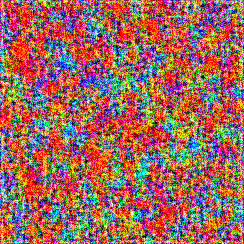

conv2_block1_0_bn (20-iters):
362.33(2s),80.49(0s),26.57(0s),12.37(0s),7.04(0s),4.88(0s),3.55(0s),2.96(0s),2.52(0s),2.21(0s),
1.97(0s),1.80(0s),1.64(0s),1.50(0s),1.40(0s),1.22(0s),1.03(0s),0.94(0s),0.87(0s),0.79(0s),



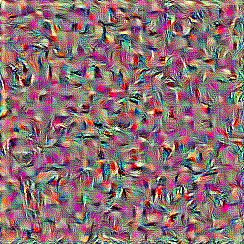

conv3_block1_0_bn (20-iters):
15.48(4s),3.47(1s),0.68(1s),0.26(1s),0.19(0s),0.19(0s),0.19(0s),0.19(0s),0.19(0s),0.19(0s),
0.19(0s),0.19(0s),0.19(0s),0.19(0s),0.19(0s),0.19(0s),0.19(0s),0.19(0s),0.19(0s),0.19(0s),



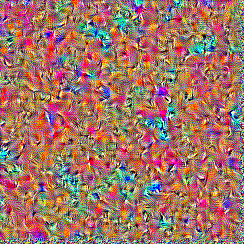

conv4_block1_0_bn (20-iters):
0.60(3s),0.60(0s),0.60(0s),0.60(0s),0.60(0s),0.60(0s),0.60(0s),0.60(0s),0.60(0s),0.60(0s),
0.60(0s),0.60(0s),0.60(0s),0.60(0s),0.60(0s),0.60(0s),0.60(0s),0.60(0s),0.60(0s),0.60(0s),



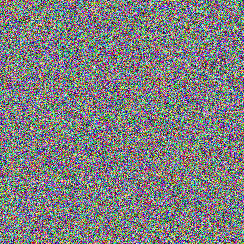

conv5_block1_0_bn (20-iters):
0.16(6s),0.16(0s),0.16(0s),0.16(0s),0.16(0s),0.16(0s),0.16(0s),0.16(0s),0.16(0s),0.16(0s),
0.16(0s),0.16(0s),0.16(0s),0.16(0s),0.16(0s),0.16(0s),0.16(0s),0.16(0s),0.16(0s),0.16(0s),



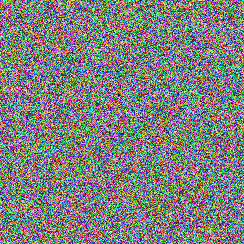

In [18]:
layer_names = [('conv1/bn',), ('conv2_block1_0_bn',), ('conv3_block1_0_bn',),
               ('conv4_block1_0_bn',), ('conv5_block1_0_bn',)]
for cnn_layer in layer_names:
  style_image_reconstruction(cnn_layer)

* We can see above that comparatively `conv2` gives better texture. And other layers are losing too much information.
* Usually in concat layers we will have better texture information from previous layers and hence, we will go through all the blocks of the layers starting with `conv2`.
* Due to memory constraints, below code is commented and only shows those images which can be candidate style representation layer.

conv2_block1_concat (20-iters):
117.61(3s),16.94(0s),5.65(0s),3.22(0s),2.28(0s),1.72(0s),1.24(0s),1.01(0s),0.86(0s),0.72(0s),
0.64(0s),0.58(0s),0.58(0s),0.58(0s),0.58(0s),0.58(0s),0.58(0s),0.58(0s),0.58(0s),0.58(0s),



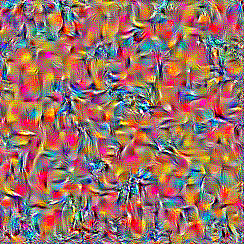

conv2_block2_concat (20-iters):
150.56(3s),22.24(0s),9.89(0s),5.86(0s),4.20(0s),3.21(0s),2.64(0s),2.23(0s),1.82(0s),1.53(0s),
1.31(0s),1.16(0s),1.03(0s),0.91(0s),0.80(0s),0.73(0s),0.68(0s),0.68(0s),0.68(0s),0.68(0s),



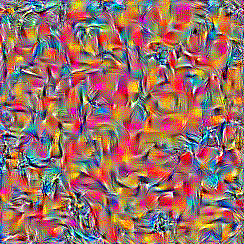

conv2_block3_concat (20-iters):
156.10(3s),26.77(0s),10.92(0s),7.17(0s),5.22(1s),3.98(0s),3.02(1s),2.51(1s),2.12(1s),1.84(1s),
1.56(1s),1.40(1s),1.28(1s),1.17(1s),1.07(1s),1.00(1s),0.93(1s),0.87(1s),0.81(1s),0.75(1s),



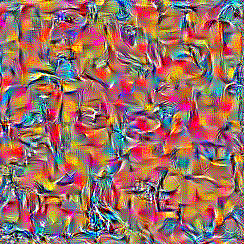

conv2_block4_concat (20-iters):
161.71(4s),28.41(1s),12.62(1s),7.71(1s),5.61(1s),4.46(1s),3.53(1s),2.78(1s),2.35(1s),2.05(1s),
1.84(1s),1.65(1s),1.49(1s),1.37(1s),1.27(1s),1.19(1s),1.12(1s),1.03(1s),0.97(1s),0.90(1s),



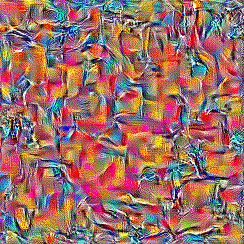

conv2_block5_concat (20-iters):
166.99(4s),30.05(1s),13.19(1s),8.02(1s),5.81(1s),4.49(1s),3.62(1s),3.06(1s),2.63(1s),2.35(1s),
2.08(1s),1.89(1s),1.72(1s),1.56(1s),1.42(1s),1.32(1s),1.24(1s),1.15(1s),1.09(1s),1.03(1s),



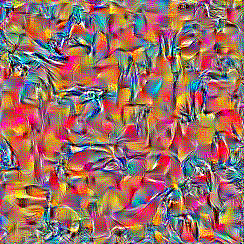

conv2_block6_concat (20-iters):
170.13(4s),34.24(1s),15.10(1s),9.14(1s),6.63(1s),5.13(1s),4.18(1s),3.52(1s),2.93(1s),2.58(1s),
2.30(1s),2.06(1s),1.88(1s),1.74(1s),1.59(1s),1.48(1s),1.39(1s),1.30(1s),1.22(1s),1.15(1s),



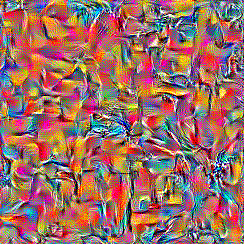

In [19]:
layer_names = [('conv2_block1_0_bn',), ('conv2_block1_0_relu',),
               ('conv2_block1_1_bn',), ('conv2_block1_1_conv',),
               ('conv2_block1_1_relu',), ('conv2_block1_2_conv',),
               ('conv2_block1_concat',), ('conv2_block2_0_bn',),
               ('conv2_block2_0_relu',), ('conv2_block2_1_bn',),
               ('conv2_block2_1_conv',), ('conv2_block2_1_relu',),
               ('conv2_block2_2_conv',), ('conv2_block2_concat',),
               ('conv2_block3_0_bn',), ('conv2_block3_0_relu',),
               ('conv2_block3_1_bn',), ('conv2_block3_1_conv',),
               ('conv2_block3_1_relu',), ('conv2_block3_2_conv',),
               ('conv2_block3_concat',), ('conv2_block4_0_bn',),
               ('conv2_block4_0_relu',), ('conv2_block4_1_bn',),
               ('conv2_block4_1_conv',), ('conv2_block4_1_relu',),
               ('conv2_block4_2_conv',), ('conv2_block4_concat',),
               ('conv2_block5_0_bn',), ('conv2_block5_0_relu',),
               ('conv2_block5_1_bn',), ('conv2_block5_1_conv',),
               ('conv2_block5_1_relu',), ('conv2_block5_2_conv',),
               ('conv2_block5_concat',), ('conv2_block6_0_bn',),
               ('conv2_block6_0_relu',), ('conv2_block6_1_bn',),
               ('conv2_block6_1_conv',), ('conv2_block6_1_relu',),
               ('conv2_block6_2_conv',), ('conv2_block6_concat',)]
# for cnn_layer in layer_names:
#   style_image_reconstruction(cnn_layer)

layer_names = [('conv2_block1_concat',), ('conv2_block2_concat',),
               ('conv2_block3_concat',), ('conv2_block4_concat',),
               ('conv2_block5_concat',), ('conv2_block6_concat',)]
for cnn_layer in layer_names:
  style_image_reconstruction(cnn_layer)

* Now we merge all the layers selected from above

conv2_block1_concat,conv2_block2_concat,conv2_block3_concat,conv2_block4_concat,conv2_block5_concat,conv2_block6_concat (20-iters):
864.17(5s),145.26(1s),61.66(1s),39.21(1s),29.22(1s),22.85(1s),19.01(1s),16.11(1s),13.71(1s),12.04(1s),
10.92(1s),9.90(1s),8.97(1s),8.23(1s),7.66(1s),7.17(1s),6.75(1s),6.35(1s),6.01(1s),5.69(1s),



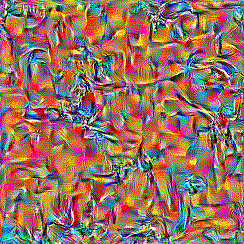

In [20]:
layer_names = [('conv2_block1_concat', 'conv2_block2_concat',
                'conv2_block3_concat', 'conv2_block4_concat',
                'conv2_block5_concat', 'conv2_block6_concat',)]
for cnn_layer in layer_names:
  style_image_reconstruction(cnn_layer)

**Note:** As it can be seen in above reconstructed style image that the texture is not yet fully concise and hence the output combination image is not that of good quality as compared to the results in original paper. 

### The total variation loss

Now we're back on simpler ground.

If you were to solve the optimisation problem with only the two loss terms we've introduced so far (style and content), you'll find that the output is quite noisy. We thus add another term, called the [total variation loss](http://arxiv.org/abs/1412.0035) (a regularisation term) that encourages spatial smoothness.

You can experiment with reducing the `total_variation_weight` and play with the noise-level of the generated image.

Total variation loss works as regularizer for smoothing the generated image.

In [0]:
def total_variation_loss(x, height, width):
    a = backend.square(x[:, :height-1, :width-1, :] - x[:, 1:, :width-1, :])
    b = backend.square(x[:, :height-1, :width-1, :] - x[:, :height-1, 1:, :])
    return backend.sum(backend.pow(a + b, 1.25))

### Final loss calculation

* As seen earlier, Style transfer is posed as an optimization problem with following loss function:
$$L_{total}(c,s,g) = \alpha L_{content}(c,g) + \beta L_{style}(s,g)$$

* We also introduce total variation loss and hence following is the overall loss function:
$$L_{total}(c,s,g) = \alpha L_{content}(c,g) + \beta L_{style}(s,g) + \gamma L_{tv}(g)$$

In [0]:
def style_transfer_loss(layers, content_weight, style_weight, tv_weight,
                        content_layer_name, style_layer_names, height, width):
    layer_features = layers[content_layer_name]
    content_image_features = layer_features[0, :, :, :]
    combination_features = layer_features[2, :, :, :]

    # alpha * L_content
    final_content_loss = content_weight * content_loss(content_image_features,
                                                       combination_features)

    final_style_loss = backend.variable(0.)
    feature_layers = style_layer_names

    for layer_name in feature_layers:
        layer_features = layers[layer_name]
        style_features = layer_features[1, :, :, :]
        combination_features = layer_features[2, :, :, :]
        sl = style_loss(style_features, combination_features, height, width)
        # beta * L_style
        final_style_loss += (style_weight / len(feature_layers)) * sl

    # gamma * L_tv
    final_tv_loss = tv_weight * total_variation_loss(combination_image, height,
                                                     width)

    # L_total
    final_loss = final_content_loss + final_style_loss + final_tv_loss
    
    return final_loss

We'll now use the feature spaces provided by specific layers of our model to define these three loss functions:
* Content loss = final_content_loss
* Style loss = final_style_loss
* Total variation loss = final_tv_loss

The relative importance of loss terms are determined by a set of scalar weights. These are  arbitrary, but the following set have been chosen after quite a bit of experimentation to find a set that generates output that's aesthetically pleasing to me.

In [0]:
content_weight = 4
style_weight = 500000
tv_weight = 0.0001
content_layer_name = 'conv2_block3_0_relu'
style_layer_names = ['conv2_block1_concat', 'conv2_block2_concat',
                     'conv2_block3_concat', 'conv2_block4_concat',
                     'conv2_block5_concat', 'conv2_block6_concat']

final_loss = style_transfer_loss(layers, content_weight, style_weight,
                                 tv_weight, content_layer_name,
                                 style_layer_names, height, width)

## Define needed gradients and solve the optimisation problem

The goal of this journey was to setup an optimisation problem that aims to solve for a *combination image* that contains the content of the content image, while having the style of the style image. Now that we have our input images massaged and our loss function calculators in place, all we have left to do is define gradients of the total loss relative to the combination image, and use these gradients to iteratively improve upon our combination image to minimise the loss.

We start by defining the gradients.

In [0]:
grads = backend.gradients(final_loss, combination_image)
outputs = [final_loss]
outputs += grads
f_outputs = backend.function([combination_image], outputs)

Now we're finally ready to solve our optimisation problem. This combination image begins its life as a random collection of (valid) pixels, and we use the [L-BFGS](https://en.wikipedia.org/wiki/Limited-memory_BFGS) algorithm (a quasi-Newton algorithm that's significantly quicker to converge than standard gradient descent) to iteratively improve upon it.

We stop after 80 iterations because the output looks good to me and the loss stops reducing significantly.

In [37]:
# Subtracting with 128. gradients converge faster
x = np.random.uniform(0, 255, (1, height, width, 3)) - 128.

iterations = 80

evaluator = Evaluator(f_outputs, height, width)

# print number of iterations
title = "%d-iters [format: loss(time-in-seconds)]:" % (iterations)
print(title)
print('='*len(title))

for i in range(iterations):
    start_time = time.time()
    x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(),
                                     fprime=evaluator.grads, maxfun=20)
    end_time = time.time()
    # print loss value & time taken in iteration i
    # format: loss(time-in-seconds)
    print("%.2f(%ds)," % (min_val, end_time - start_time), end='')

    # print new line so that we don't exceed way out of screen
    if ((i+1) % 5 == 0):
      print()

80-iters [format: loss(time-in-seconds)]:
483531008.00(7s),269808896.00(7s),206679456.00(7s),176362096.00(7s),159217648.00(7s),
146495056.00(7s),138160496.00(7s),132035136.00(7s),127673504.00(7s),124130248.00(7s),
121484848.00(7s),118959768.00(7s),116933888.00(7s),115401248.00(7s),114164640.00(7s),
113161784.00(7s),112361808.00(7s),111742976.00(7s),111228368.00(7s),110811784.00(7s),
110486784.00(7s),110225296.00(7s),110015504.00(7s),109833736.00(7s),109683008.00(7s),
109558064.00(7s),109452888.00(7s),109363936.00(7s),109283280.00(7s),109210024.00(7s),
109146464.00(7s),109089016.00(7s),109037920.00(7s),108993464.00(7s),108954744.00(7s),
108920664.00(7s),108890296.00(7s),108863688.00(7s),108840480.00(7s),108820352.00(7s),
108801976.00(7s),108785352.00(7s),108770760.00(7s),108756600.00(7s),108742704.00(7s),
108730368.00(7s),108718808.00(7s),108708120.00(7s),108698352.00(7s),108689312.00(7s),
108680848.00(7s),108672960.00(7s),108665272.00(7s),108658176.00(7s),108651440.00(7s),
108645320.00

Content Image


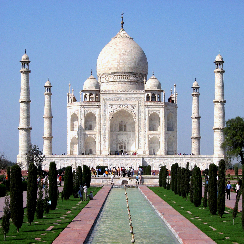

Style Image


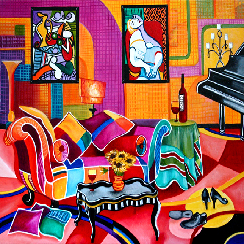

Combination Image


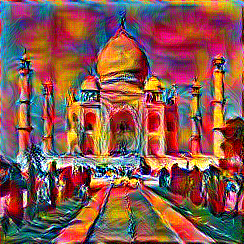

In [26]:
print("Content Image")
visualise_img(content_array, height, width)
print("Style Image")
visualise_img(style_array, height, width)
print("Combination Image")
visualise_img(x, height, width)

## Overall code

* Following is overall code as we saw from above.
* Due to memory constraints, we visualised only 244x244 images. Following can be used to estimate time taken by this algorithm and also to play with different images of **different sizes** for style transfer.



80-iters [format: loss(time-in-seconds)]:
458811040.00(15s),259987328.00(7s),198441568.00(7s),168911088.00(7s),152311504.00(7s),
141540128.00(7s),133982568.00(7s),128701864.00(7s),124901520.00(7s),121879168.00(7s),
119514528.00(7s),117662016.00(7s),116207408.00(7s),115085936.00(7s),114127504.00(7s),
113356024.00(7s),112755912.00(7s),112249864.00(7s),111836104.00(7s),111510152.00(7s),
111243368.00(7s),111025440.00(7s),110852296.00(7s),110709584.00(7s),110582872.00(7s),
110472336.00(7s),110379424.00(7s),110298392.00(7s),110227680.00(7s),110165160.00(7s),
110112216.00(7s),110066416.00(7s),110027112.00(7s),109993128.00(7s),109961272.00(7s),
109931888.00(7s),109905376.00(7s),109881208.00(7s),109858928.00(7s),109838496.00(7s),
109819424.00(7s),109801856.00(7s),109785784.00(7s),109770832.00(7s),109756888.00(7s),
109743448.00(7s),109731296.00(7s),109719816.00(7s),109709184.00(7s),109699336.00(7s),
109690440.00(7s),109682160.00(7s),109674072.00(7s),109666704.00(7s),109659744.00(7s),
109653200.0

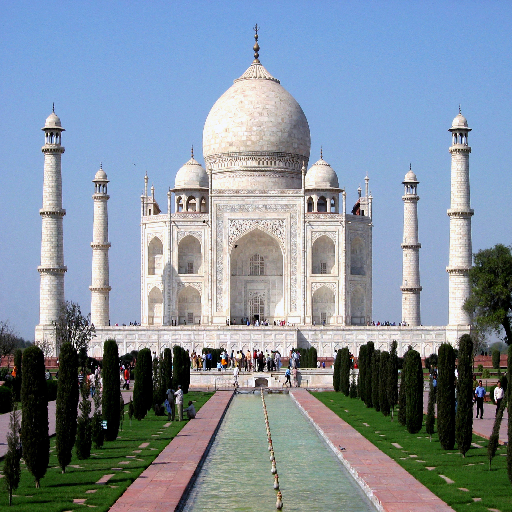

Style Image


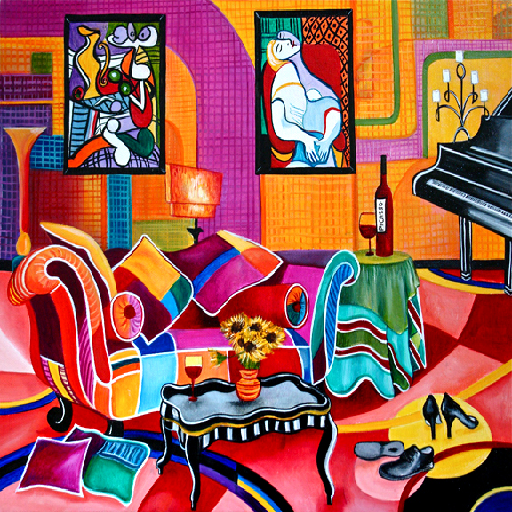

Combination Image


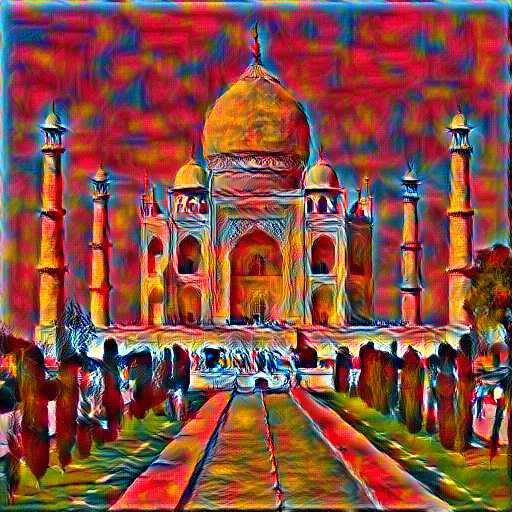

In [38]:
content_img_url = "https://upload.wikimedia.org/wikipedia/commons/c/c8/Taj_Mahal_in_March_2004.jpg"
style_img_url = "http://1.bp.blogspot.com/-yqh8zFJh_OU/UcDJKe-EYaI/AAAAAAAAS2I/Qb3bm2zwQu0/s1600/%5BIMG+SRC=%22URL%22+ALT=picasso+painting,+romancing+picasso+painting,+colorful+oil+painting,k+madison+moore+artist%5D++copy.jpg"

height = 512
width = 512

content_weight = 4
style_weight = 500000
total_variation_weight = 0.0001
content_layer_name = 'conv2_block3_0_relu'
style_layer_names = ['conv2_block1_concat', 'conv2_block2_concat',
                     'conv2_block3_concat', 'conv2_block4_concat',
                     'conv2_block5_concat', 'conv2_block6_concat']

response = requests.get(content_img_url)
content_image = Image.open(BytesIO(response.content))
content_image = content_image.resize((height, width))

response = requests.get(style_img_url)
style_image = Image.open(BytesIO(response.content))
style_image = style_image.resize((height, width))

content_array = np.asarray(content_image, dtype='float32')
content_array = np.expand_dims(content_array, axis=0)

style_array = np.asarray(style_image, dtype='float32')
style_array = np.expand_dims(style_array, axis=0)


content_image = backend.variable(content_array)
style_image = backend.variable(style_array)
combination_image = backend.placeholder((1, height, width, 3))

input_tensor = backend.concatenate([content_image,
                                    style_image,
                                    combination_image], axis=0)

model = DenseNet121(input_tensor=input_tensor, weights='imagenet',
                    include_top=False)
layers = dict([(layer.name, layer.output) for layer in model.layers])

final_loss = style_transfer_loss(layers, content_weight, style_weight,
                                 total_variation_weight, content_layer_name,
                                 style_layer_names, height, width)

grads = backend.gradients(final_loss, combination_image)
outputs = [final_loss]
outputs += grads
f_outputs = backend.function([combination_image], outputs)

# Subtracting with 128. gradients converge faster
x = np.random.uniform(0, 255, (1, height, width, 3)) - 128.

iterations = 80

evaluator = Evaluator(f_outputs, height, width)

# print number of iterations
title = "%d-iters [format: loss(time-in-seconds)]:" % (iterations)
print(title)
print('='*len(title))

for i in range(iterations):
    start_time = time.time()
    x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(),
                                     fprime=evaluator.grads, maxfun=20)
    end_time = time.time()
    # print loss value & time taken in iteration i
    # format: loss(time-in-seconds)
    print("%.2f(%ds)," % (min_val, end_time - start_time), end='')

    # print new line so that we don't exceed way out of screen
    if ((i+1) % 5 == 0):
      print()

print("Content Image")
visualise_img(content_array, height, width)
print("Style Image")
visualise_img(style_array, height, width)
print("Combination Image")
visualise_img(x, height, width)

# Conclusion and further improvements

* Above output can be improved as the results are not comparable with one showed in paper.
* We can try different combination of layers for style representation to get better output. Also maybe assigning different weights to the chosen layer outputs would yield better results.
* We can also try higher DenseNet models.
* As beautiful as the output of this code can be, the process we use to generate it is quite slow. And no matter how much you speed this algorithm up (with GPUs and creative hacks), it is still going to be a relatively expensive problem to solve. This is because we're solving an entire optimisation problem by multiple forward and backward passes each time we want to generate an image.
* Try faster version of this algorithm  ([Johnson et al., 2016](https://arxiv.org/abs/1603.08155)), where the optimisation problem will be replaced with an image transformation CNN, which in turn uses the VGG16 network as before to measure losses. When this transformation network is trained on many images given a fixed style image, we end up with a fully feed-forward CNN that we can apply for style transfer. This gives us a 1000x speed up over this implementation.

# Compartive Studies

## Perceptual Losses for Real-Time Style Transfer and Super-Resolution by Johnson et al., 2016

* The main contribution of the [paper](https://arxiv.org/pdf/1603.08155.pdf) proposed by Johnson et. al is that feeding forward the generated image to a pre-trained image classification model and extracting the output from some intermediate layers to calculate losses would produce similar results of Gatys et al but with significantly less computational resources. 
* Paper shows that if we limit ourselves to a single style image, we can train a neural network to solve this optimisation problem for us in real-time and transform any given content image into a styled version.
* Below gives a system overview as proposed in paper:

![perceptual_loss_style_transfer](http://www.yangmingwen.com/assets/posts/2017-12/UniversalStyle2.png)

* The system consists of two networks:
  * Image transformation network - A multi-layer convolutional neural network which will transform input image to output image, where output has both content and style representation of content image and style image respectively. It consists of 3 layers of convolution and ReLU non-linearity, 5 residual blocks, 3 transpose convolutional layers and finally a non-linear tanh layer which produces an output image. Network performs downsampling using strided convolution to increase receptive field signficantly and then performs upsampling using fractionally strided convolution to have output image size same as input image.
  * Loss network - Used to calculate loss between input image and generated image. It is calculated in same way as we saw in Gatys et al. (2015). In this paper, the representations are calculated using the VGG network, which is a network that has been pre-trained for object recognition. One can use other networks as well like Densenet as we did with the approach by Gatys et al. (2015).
 
* Given this system, we can then train the image transformation network to reduce the total style transfer loss. To train the network, one can pick a fixed style image and use a large batch of different content images as training examples. In their paper, Johnson et. al trained their network on the Microsoft COCO dataset - which is an object recognition dataset of 80,000 different images.

* Training involves using the loss network to evaluate the loss for a given training example and then propagating this error back through every layer in the image transformation network. So the first part of the structure is a “Image Transform Net” which generate new image from the input image. And the second part is simply a “Loss Network”, which is the feeding forward part.The weight of the loss network is fixed and will not be updated during training.

* Testing involves passing the image through transformation network and after final layer it will produce a valid image which has style imposed on content image. This means the generated output must contain values that are all in the valid pixel range of 0 to 255. To achieve this there is tanh layer in transformation network which is scaled to have output in the range of 0 to 255.

* As this requires enough compute power to train the network, we won't be implementing this here. The whole idea of describing this paper here is to see an alternative faster approach which can be used in real-time for style transfer. It can be seen above that during testing we are only doing single forward pass and hence the speed compared to the approach seen in Gatys et al. (2015).

## Universal Style Transfer via Feature Transforms by Li et al., 2017

* As seen in Gatys et al paper, the optimization-based methods can handle arbitrary styles with pleasing visual quality but at the expense of high computational costs. And as seen in Perceptual Loss function based style transfer paper that feed-forward approaches can be executed efficiently but are limited to a fixed number of styles or compromised visual quality.

* This paper proposes a simple yet effective method for universal style transfer which achieves the style-agnostic generalization ability with marginally compromised visual quality and execution efficiency.

* It formulates style transfer as an image reconstruction process coupled with feature transformation, i.e., whitening and coloring. The reconstruction part is responsible for inverting features back to the RGB space and the feature transformation matches the statistics of a content image to a style image.

* Hence there are two parts to this approach:

    1. Recontruction decoder:
        * An auto-encoder network is constructed for general image reconstructiion. A pretained model (like VGG-19, from paper) is used as encoder and its weights are fixed to train a decoder network for inverting (VGG) features to the original image. Decoder is designed to be symmetrical to that of encoder network with the nearest neighbor upsampling layer used for enlarging feature maps. ![Encoder-Decoder](https://cdn-images-1.medium.com/max/1600/1*ybzfpSxRJzS6hV3fjgTlPQ.png)
        * Evaluation involves selecting feature maps at different layers of the network and train decoders from different layers accordingly. The pixel reconstruction loss and feature loss are employed for reconstructing an input image: $$L = ||I_o - I_i||^2_2 + \lambda  ||\phi(I_o) - \phi (I_i) ||^2_2$$
        * where $I_i, I_o$ are the input image and reconstruction output, and $\phi$ is the encoder that extracts the features from selected layer. In addition, $\lambda$ is the weight to balance the two losses.
        * Post training, the decoder is fixed (i.e. will not be fine-tuned) and is used as feature inverter.

    2. Whitening and coloring transforms (WCT)
        * Given a pair for content image and style image, first vectorized feature maps are extracted from certain layer, say $f_c$ and $f_s$ for content and style image feature map respectively. The decoder will reconstruct the original image if $f_c$ is directly fed into it. It then uses WCT to adjust $f_c$ with respect to the statistics of $f_s$. The goal of WCT is to directly transform $f_c$ to match the covariance matrix of $f_s$. ![WCT](https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRg7MBrHzo6wElOp5hpcMNwlwmCJg-Z8rqu7pPsRPLwpJazKGfd)
        * Please refer to the paper for more information on WCT.

* For improved results the paper also present a multi-level stylization pipeline, which takes all level of information of a style into account. ![Multi-level stylization](https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQdiHuzLVjj7nrpwhESNXvHO26NB6X68HC6FVyIhOxllFrwvSi14w)

* In short, the algorithm works by unfolding the image generation process via training an auto-encoder for image reconstruction. And then integrates the whitening and coloring transforms in the feed-forward passes to match the statistical distributions and correlations between the intermediate features of content and style.

* Given time constraints and compute resources the code is not implemented for this algorithm. Also paper uses MS COCO dataset to train the decoder.
* As seen in this paper, it does not require learning for each individual style. And hence is a better algorithm as compared to other methods seen in this notebook.

# References
1. [A neural algorithm of artistic style (2015)](https://arxiv.org/pdf/1508.06576.pdf) - Leon A. Gatys, Alexander S. Ecker, Matthias Bethge
2. [Densely Connected Convolutional Networks](https://arxiv.org/pdf/1608.06993) - Gao Huang, Zhuang Liu, Laurens van der Maaten, Kilian Q. Weinberger
3. [Perceptual Losses for Real-Time Style Transfer and Super-Resolution](https://arxiv.org/pdf/1603.08155.pdf) - Justin Johnson, Alexandre Alahi, Li Fei-Fei
4. [Artistic style transfer implementation with a repurposed VGG-Net-16](https://github.com/hnarayanan/artistic-style-transfer/blob/master/notebooks/6_Artistic_style_transfer_with_a_repurposed_VGG_Net_16.ipynb) - H. Narayanan
5. [Fast Neural Style - Code](https://github.com/jcjohnson/fast-neural-style) - Justin Johnson et al.
6. [Universal Style Transfer via Feature Transforms](https://arxiv.org/pdf/1705.08086.pdf) - Li et al.
7. [Tensorflow/Keras implementation of WCT](https://github.com/eridgd/WCT-TF)